In [1]:
%%capture
!pip install datasets
!pip install transformers
!pip install torchaudio
!pip install jiwer
!pip install accelerate -U
!pip install diffusers


In [2]:
from transformers import SeamlessM4TFeatureExtractor, Wav2Vec2BertModel
from diffusers import StableDiffusionPipeline
import torch
import numpy as np
import torchaudio

class AudioToImagePipeline:
    def __init__(self, audio_encoder, feature_extractor, diffusion_pipeline,device):
        self.feature_extractor = feature_extractor
        self.audio_encoder = audio_encoder
        self.device = device
        self.diffusion_pipeline = diffusion_pipeline


    def __call__(self, audio_file):
        with torch.no_grad():
            waveform, sample_rate=self.load_audio(audio_file)
            white_noise=self.get_white_noise()
            bos_emb=self.get_bos().to(self.device)
            prompt_embeds = self.feature_extractor(waveform,sampling_rate=16000, return_tensors="pt", truncation=True, padding='max_length', max_length=375)
            prompt_embeds = self.audio_encoder(prompt_embeds.input_features).last_hidden_state.to(self.device)
            negative_prompt_embeds = self.feature_extractor(white_noise,sampling_rate=16000, return_tensors="pt", truncation=True, padding='max_length', max_length=375)
            negative_prompt_embeds = self.audio_encoder(negative_prompt_embeds.input_features).last_hidden_state.to(self.device)
            prompt_embeds = torch.cat((bos_emb[:,0,:].unsqueeze(1), prompt_embeds),dim=1)
            negative_prompt_embeds = torch.cat((bos_emb[:,0,:].unsqueeze(1), negative_prompt_embeds),dim=1)
            self.diffusion_pipeline.to(self.device)
            image=self.diffusion_pipeline(prompt_embeds=prompt_embeds,negative_prompt_embeds=negative_prompt_embeds).images[0]
        return image

    def load_audio(self, audio_file):
        waveform, sample_rate = torchaudio.load(audio_file)
        return waveform, sample_rate

    def get_bos(self):
        text_encoder=self.diffusion_pipeline.text_encoder.to("cpu")
        tokenizer=self.diffusion_pipeline.tokenizer
        bos_token=tokenizer("",return_tensors="pt", truncation=True, padding='max_length', max_length=48)
        bos_emb=text_encoder(**bos_token).last_hidden_state
        return bos_emb

    def get_white_noise(self):
        duration,samplerate,amplitude = 4.0, 16000, 0.01
        white_noise = amplitude * np.random.randn(int(duration * samplerate))
        zero_noise  = np.zeros(int(duration * samplerate))
        return white_noise



In [3]:
pipeline = AudioToImagePipeline(
    audio_encoder=Wav2Vec2BertModel.from_pretrained('youzarsif/wav2vec2bert_1728'),
    feature_extractor=SeamlessM4TFeatureExtractor.from_pretrained('youzarsif/wav2vec2bert_1728',stride = 2),
    diffusion_pipeline=StableDiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-2-1"),
    device=torch.device("cuda" if torch.cuda.is_available() else "cpu")
)





/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/1.90k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.52G [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/275 [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/939 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [2]:
import torchaudio
import os
from IPython.display import display
images = []
folder="audio"
I = [os.path.join(folder, f) for f in os.listdir(folder) if f.endswith('.wav')]

In [5]:
for i in range(len(I)):
  images.append(pipeline(I[i]))


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
image_folder="images"
for i in range(len(I)):
    audio_name = os.path.basename(I[i]) 
    image_name = os.path.splitext(audio_name)[0] + '.png' 
    images[i].save(os.path.join(image_folder, image_name)) 

In [3]:
J= [os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith('.png')]

audio/alarm.wav


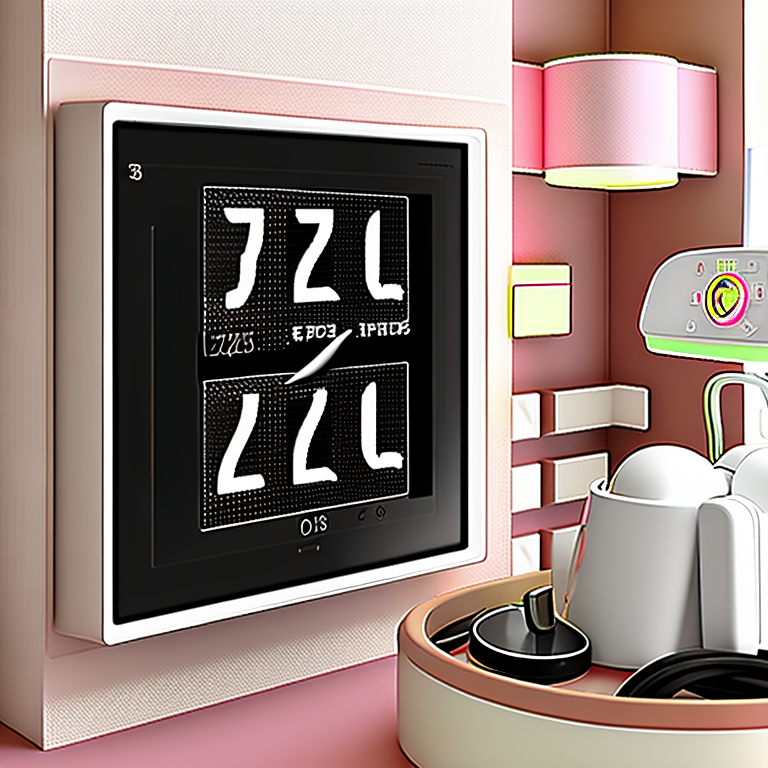

audio/birds-from-a-balcony-at-sunrise-in-denton-texas-032912-23057.wav


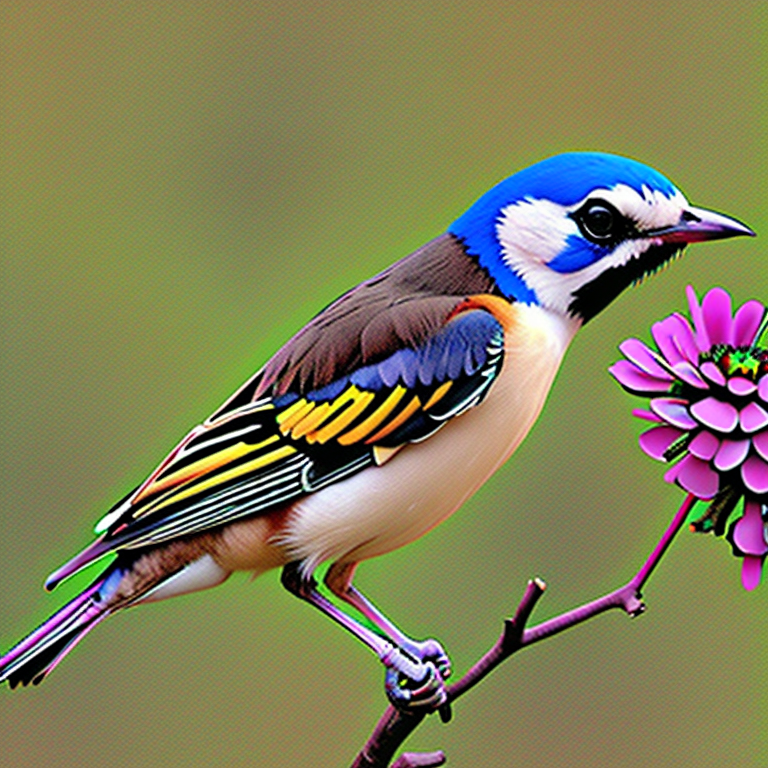

audio/firework-show-short-64657.wav


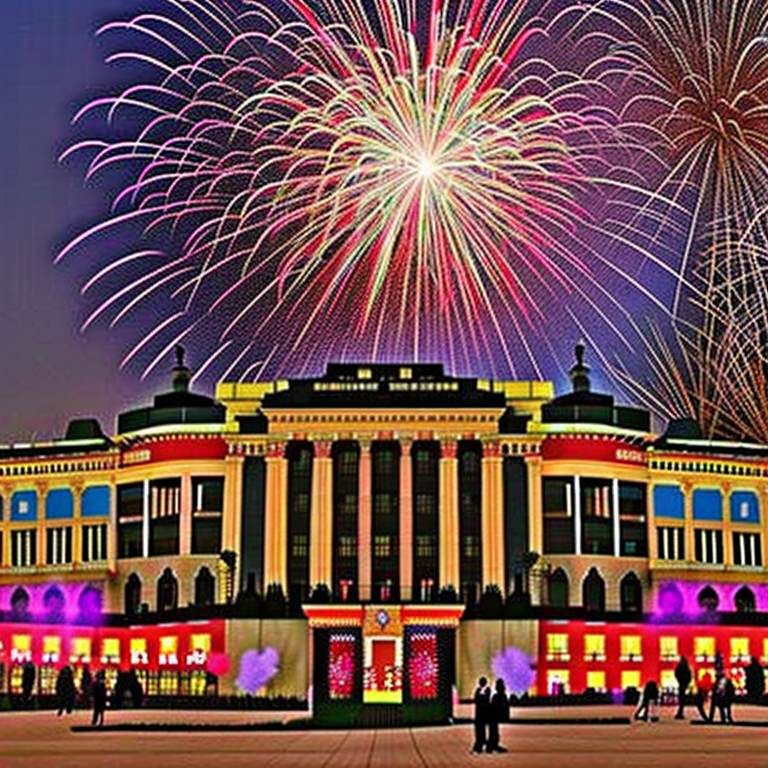

audio/pianos-by-jtwayne-7-174717.wav


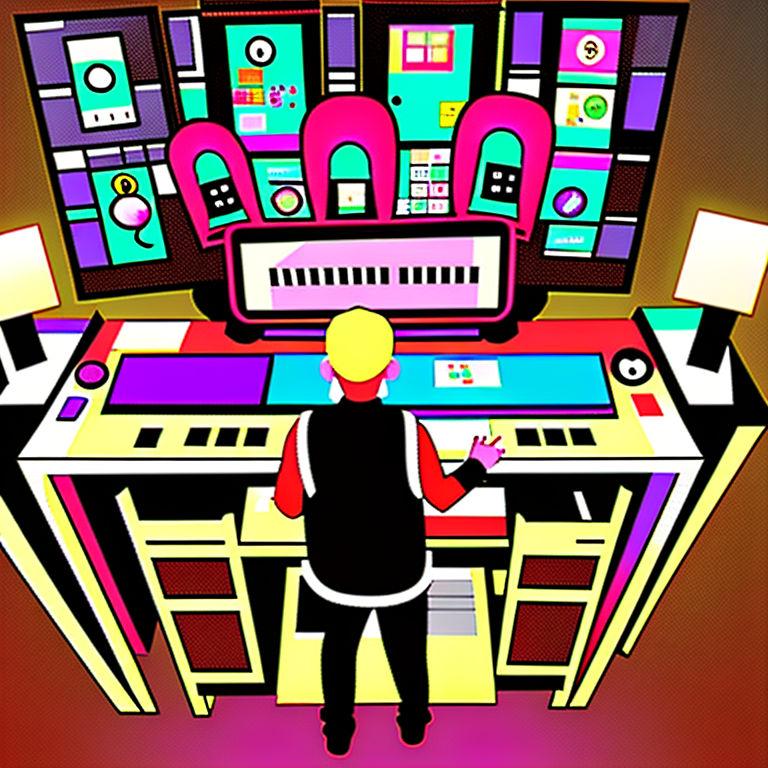

audio/thunder_3-144891-B-19.wav


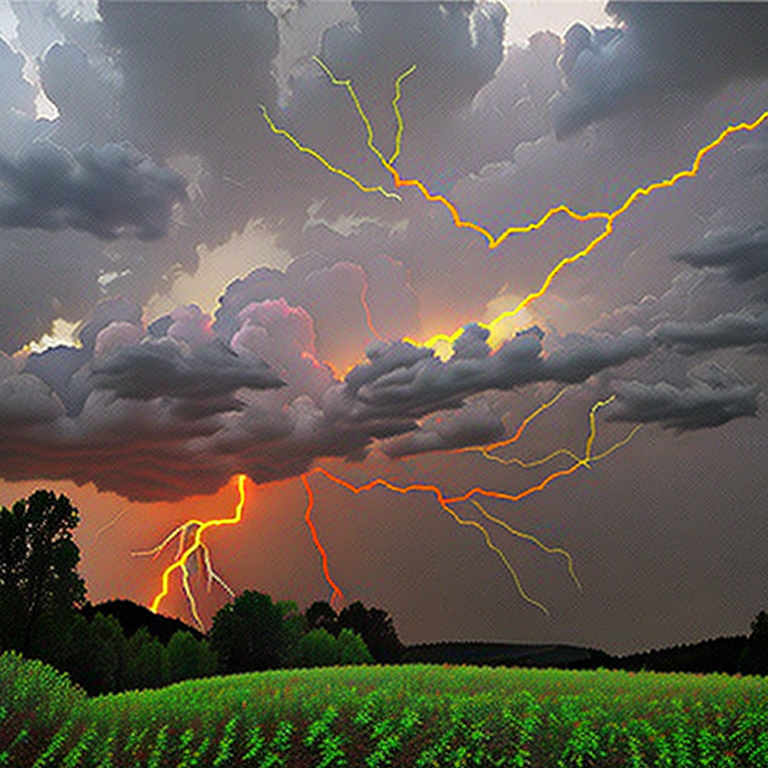

audio/urban-fountain-san-francisco-24562.wav


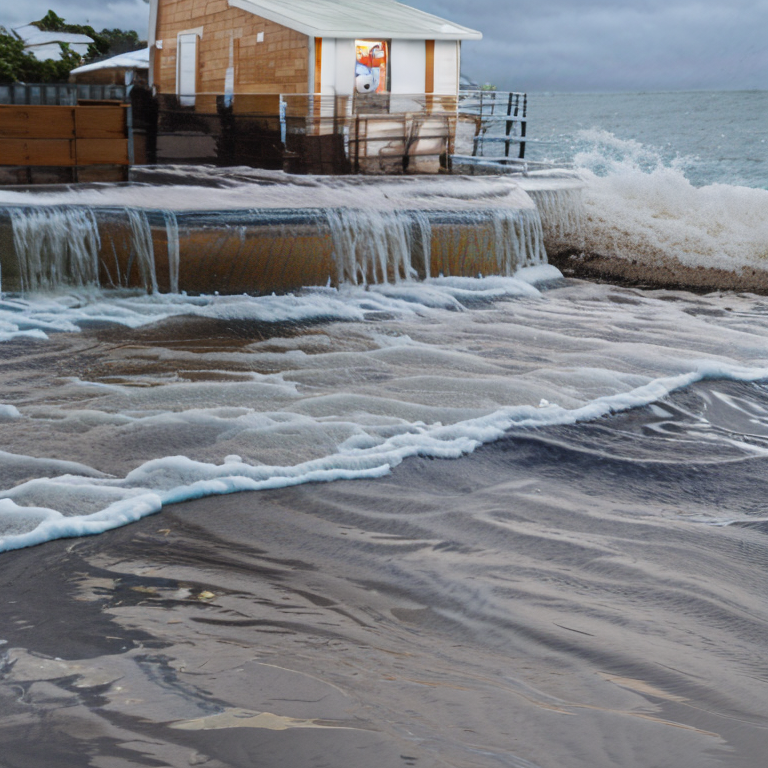

audio/wafb_fill_acoustic_105_soundcity1-85457.wav


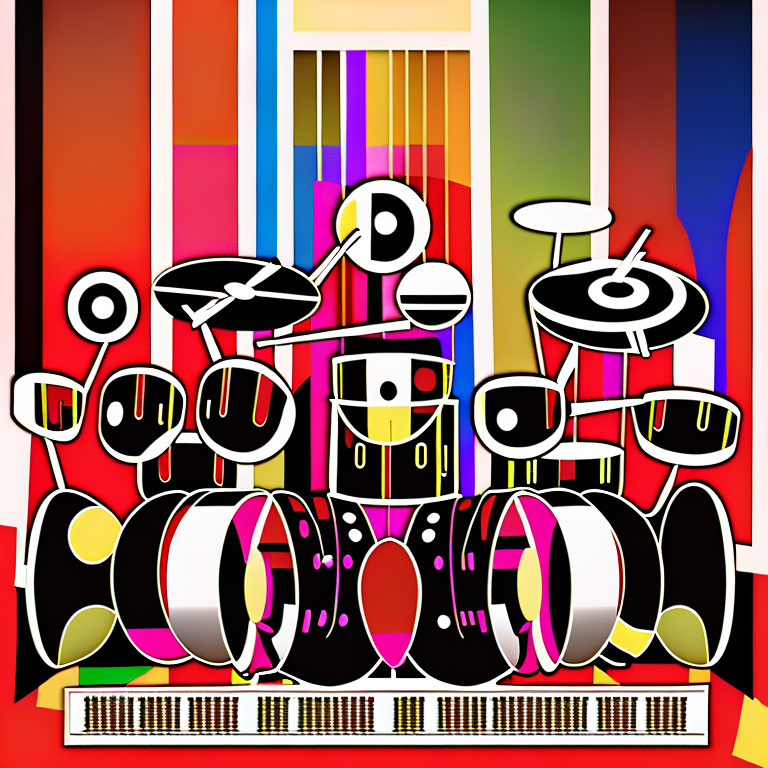

In [4]:
from IPython.display import Audio, Image

for i in range(len(I)):
    print(I[i])
    audio = Audio(I[i])
    image=Image(J[i])
    display(audio, image)
